In [1]:
import matplotlib.pyplot as plt
import stlearn as st
import scanpy as sc
import numpy as np

/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/stlearn_250218/lib/python3.8/site-packages/stlearn/tools/microenv/cci/het.py:192: NumbaDeprecationWarning: The keyword argument 'nopython=False' was supplied. From Numba 0.59.0 the default is being changed to True and use of 'nopython=False' will raise a warning as the argument will have no effect. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @jit(parallel=True, nopython=False)


In [2]:
import os
os.getcwd()

'/data/User/revolvefire/projects/Xenium'

In [3]:
adata = st.ReadXenium(feature_cell_matrix_file="/mnt/gmi-l1/_90.User_Data/revolvefire/fastq/Xenium/PD2_reseg/outs/cell_feature_matrix.h5",
                     cell_summary_file="/mnt/gmi-l1/_90.User_Data/revolvefire/fastq/Xenium/PD2_reseg/outs/cells.csv.gz",
                     library_id="PD2_reseg",
                     #image_path="/mnt/gmi-l1/_90.User_Data/revolvefire/fastq/Xenium/PD2_reseg/outs/morphology_focus.ome.tif",
                     scale=1,
                     spot_diameter_fullres=15 # Recommend
                     )

In [4]:
adata

AnnData object with n_obs × n_vars = 16623 × 297
    obs: 'imagecol', 'imagerow'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [5]:
sc.pp.filter_genes(adata, min_counts=10)
sc.pp.filter_cells(adata,min_counts=10)

In [6]:
# Store the raw data for using PSTS
adata.raw = adata

In [7]:
adata.raw = adata
# Normalization data
sc.pp.normalize_total(adata)

In [8]:
# Squareroot normalize transcript counts. We need to deal with sparse matrix of .X
#from scipy.sparse import csr_array
#adata.X = np.sqrt(adata.X.toarray()) + np.sqrt(adata.X.toarray() + 1)
# If the matrix is small, we don't need to convert to numpy array. I believe, Xenium data is always large
# adata.X = csr_array(np.sqrt(adata.X) + np.sqrt(adata.X + 1))

# If you want to use log transformation, please use:
st.pp.log1p(adata)

Log transformation step is finished in adata.X


In [9]:
adata

AnnData object with n_obs × n_vars = 15850 × 297
    obs: 'imagecol', 'imagerow', 'n_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'n_counts'
    uns: 'spatial', 'log1p'
    obsm: 'spatial'

In [10]:
# Run PCA
st.em.run_pca(adata,n_comps=50,random_state=0)

PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


In [11]:
# Compute neighborhood graph of cells using the PCA representation
st.pp.neighbors(adata,n_neighbors=25,use_rep='X_pca',random_state=0)

2025-03-05 15:01:59.224251: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F AVX512_VNNI AVX512_BF16 AVX_VNNI AMX_TILE AMX_INT8 AMX_BF16 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-03-05 15:01:59.316258: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


Created k-Nearest-Neighbor graph in adata.uns['neighbors'] 


In [12]:
sc.tl.leiden(adata, resolution=1.5)

In [13]:
sc.tl.umap(adata)

/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/stlearn_250218/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


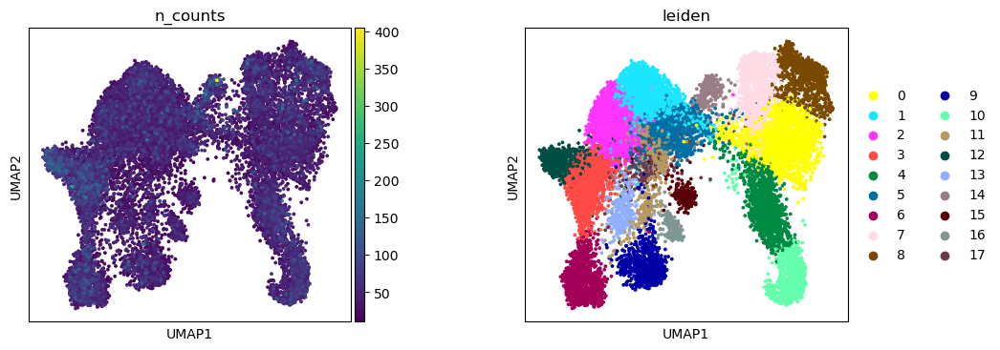

In [14]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata, color=["n_counts", "leiden"], palette=sc.pl.palettes.default_102, wspace=0.4, size=30)

/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/stlearn_250218/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


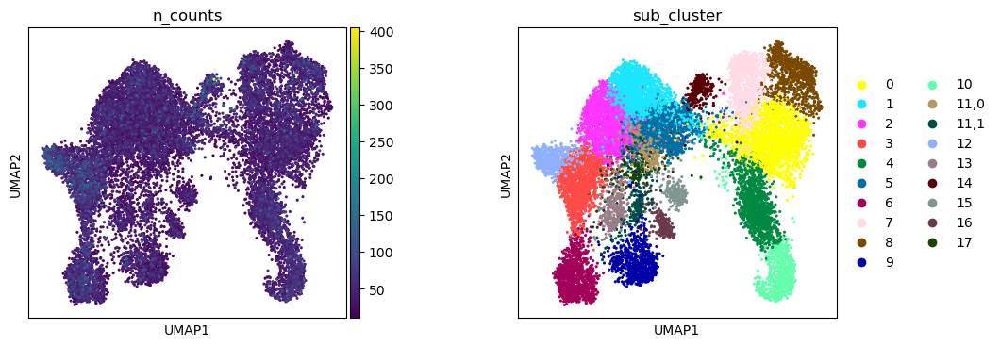

In [15]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.tl.leiden(adata, restrict_to=('leiden', ['11']), resolution=0.3, key_added='sub_cluster')
sc.pl.umap(adata, color=["n_counts", "sub_cluster"], palette=sc.pl.palettes.default_102, wspace=0.4, size=20)

In [16]:
leiden_df = adata.obs["leiden"].reset_index()

# Rename the columns to 'cell_id' and 'leiden'
leiden_df.columns = ['cell_id', 'group']

# Save the DataFrame to a CSV file
leiden_df.to_csv('leiden_clusters_pd2_250305.raw.csv', index=False)

In [17]:
print(adata.obs["sub_cluster"].unique())

['3', '11,1', '6', '14', '5', ..., '8', '1', '10', '4', '17']
Length: 19
Categories (19, object): ['0', '1', '2', '3', ..., '14', '15', '16', '17']


In [18]:
cluster_mapping = {
    "0": "Outer HFKC",
    "1": "Papillary FIB",
    "2": "Reticular FIB",
    "3": "Ret/Hypo FIB",
    "4": "BK",
    "5": "DS",
    "6": "PCM",
    "7": "Hair matrix",
    "8": "Mat/Inner HFKC",
    "9": "EC",
    "10": "SBK",
    "11,0": "APM",
    "11,1": "Pericyte",
    "12": "Interstitial FIB",
    "13": "Macrophage",
    "14": "DP",
    "15": "Adipocyte",
    "16": "Lymphocyte",
    "17": "Schwann cell"
    
    
    # Add more mappings as needed
}


In [19]:
adata.obs["leiden"] = adata.obs["sub_cluster"].map(cluster_mapping)

In [20]:
adata.obs["leiden"]

aaacbifa-1     Ret/Hypo FIB
aaadeccg-1         Pericyte
aaafjmhl-1     Ret/Hypo FIB
aaaificf-1     Ret/Hypo FIB
aaamjhef-1     Ret/Hypo FIB
                  ...      
oijpkgai-1               BK
oikcbbbf-1               BK
oikcdnhk-1               BK
oikepagl-1    Papillary FIB
oikfplad-1       Outer HFKC
Name: leiden, Length: 15850, dtype: category
Categories (19, object): ['Outer HFKC', 'Papillary FIB', 'Reticular FIB', 'Ret/Hypo FIB', ..., 'DP', 'Adipocyte', 'Lymphocyte', 'Schwann cell']

In [21]:
new_order = ['APM', 'DS', 'DP', 'Papillary FIB', 'Reticular FIB', 'Ret/Hypo FIB', 'Adipocyte', 'Interstitial FIB', 'PCM', 'BK', 'SBK', 'Outer HFKC', 'Mat/Inner HFKC', 'Hair matrix', 'EC', 'Pericyte', 'Macrophage', 'Lymphocyte', 'Schwann cell'
]

In [22]:
adata.obs["leiden"] = adata.obs["leiden"].cat.reorder_categories(new_order, ordered=True)


In [23]:
# scale and store results in layer
adata.layers["scaled"] = sc.pp.scale(adata, copy=True).X

/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/stlearn_250218/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/stlearn_250218/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/stlearn_250218/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


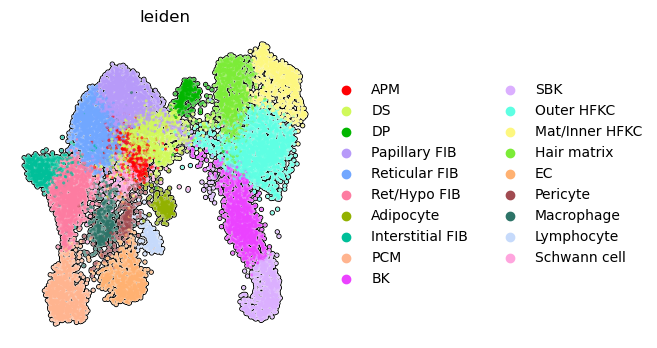

In [24]:
new_colors = [
    '#FF0004', '#D0F95A', '#02B600', '#B79AF9', '#71A7FF', '#FD7CA1',
    '#92B100', '#00BF99', '#FFB48F', '#EB42FF', '#DBAFFF', '#5EFFE3',
    '#FDF77F', '#7CEC37', '#FFB171', '#A14B51', '#2D7468', '#C6DAFB', '#FFA5DE'
]

# Update the color palette for leiden categories
sc.pl.umap(
    adata,
    color="leiden",  # Ensure "leiden" matches your labels
    palette=new_colors,  # Apply the reordered color palette
    size=20,  # Adjust marker size if necessary
    wspace=0.4 , add_outline=True, frameon=False,
)

In [ ]:
#for xenium explorer

In [25]:
leiden_df = adata.obs["leiden"].reset_index()

# Rename the columns to 'cell_id' and 'leiden'
leiden_df.columns = ['cell_id', 'group']

# Save the DataFrame to a CSV file
leiden_df.to_csv('labeld_pd2_250305.csv', index=False)

In [ ]:
#adata.write("250305.PD2.final.h5ad")

In [26]:
sc.read("250305.PD2.final.h5ad")

Only considering the two last: ['.final', '.h5ad'].
Only considering the two last: ['.final', '.h5ad'].


AnnData object with n_obs × n_vars = 15850 × 297
    obs: 'imagecol', 'imagerow', 'n_counts', 'leiden', 'sub_cluster'
    var: 'gene_ids', 'feature_types', 'genome', 'n_counts'
    uns: 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'spatial', 'sub_cluster_colors', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'scaled'
    obsp: 'connectivities', 'distances'

/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/stlearn_250218/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/stlearn_250218/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/stlearn_250218/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


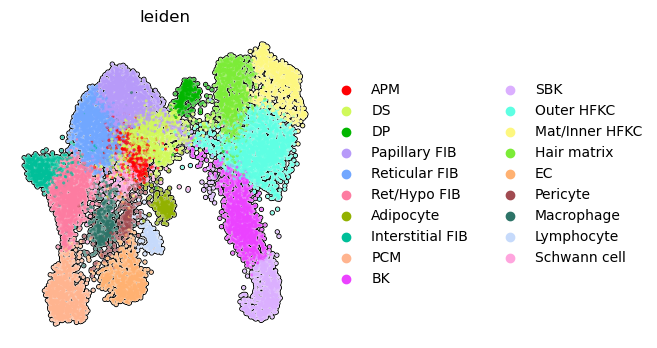

In [27]:
sc.pl.umap(
    adata,
    color="leiden",  
    #palette=new_colors, 
    size=20,  
    wspace=0.4 , add_outline=True, frameon=False,
)

In [29]:
#for spatial analysis
cluster_mapping = {
    "APM": "0",
    "DS": "1",
    "DP": "2",
    "Papillary FIB": "3",
    "Reticular FIB": "4",
    "Ret/Hypo FIB": "5",
    "Adipocyte": "6",
    "Interstitial FIB": "7",
    "PCM": "8",
    "BK": "9",
    "SBK": "10",
    "Outer HFKC": "11",
    "Mat/Inner HFKC": "12",
    "Hair matrix": "13",
    "EC": "14",
    "Pericyte": "15",
    "Macrophage": "16",
    "Lymphocyte": "17",
    "Schwann cell": "18"
}


In [30]:
adata.obs["leiden2"] = adata.obs["leiden"].map(cluster_mapping)

In [31]:
adata.obs["leiden2"].astype('category')
adata.obs["leiden2"]

aaacbifa-1     5
aaadeccg-1    15
aaafjmhl-1     5
aaaificf-1     5
aaamjhef-1     5
              ..
oijpkgai-1     9
oikcbbbf-1     9
oikcdnhk-1     9
oikepagl-1     3
oikfplad-1    11
Name: leiden2, Length: 15850, dtype: category
Categories (19, object): ['0' < '1' < '2' < '3' ... '15' < '16' < '17' < '18']

/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/stlearn_250218/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/stlearn_250218/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/stlearn_250218/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


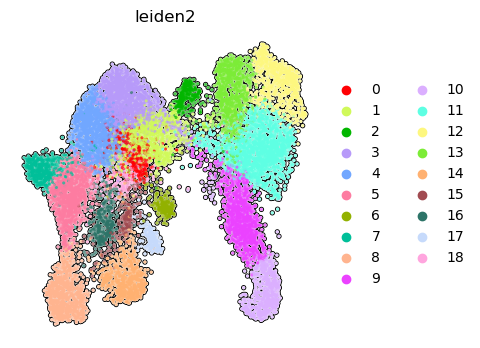

In [32]:
sc.pl.umap(
    adata,
    color="leiden2",  # Ensure "leiden" matches your labels
    palette=new_colors,  # Apply the reordered color palette
    size=20,  # Adjust marker size if necessary
    wspace=0.4 , add_outline=True, frameon=False,
)

In [82]:
adata.uns["iroot"] = st.spatial.trajectory.set_root(
    adata,
    use_label="leiden2",
    cluster="3",
    use_raw=True
)
adata.uns["iroot"]

14667

In [83]:
st.spatial.trajectory.pseudotime(adata,eps=50,use_rep="X_pca",use_label="leiden2")

All available trajectory paths are stored in adata.uns['available_paths'] with length < 4 nodes


In [84]:
#only numeric value works?

In [85]:
st.spatial.trajectory.pseudotimespace_global(adata,use_label="leiden2",list_clusters=["3","0"])

Start to construct the trajectory: 3 -> 0


In [ ]:
import matplotlib.pyplot as plt

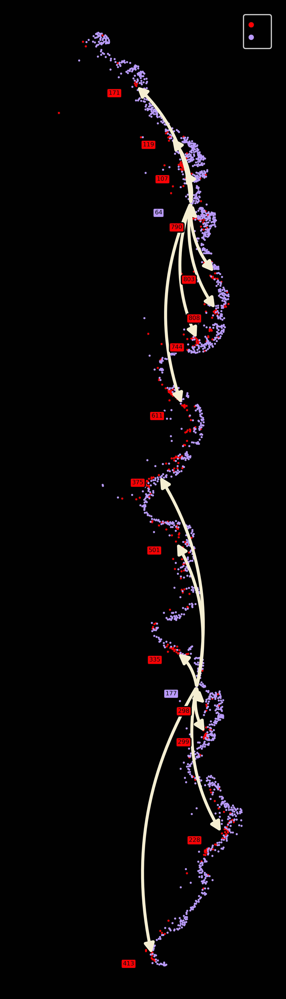

In [87]:
plt.rcParams["axes.facecolor"] = "black"  
plt.rcParams["figure.facecolor"] = "black"  
plt.rcParams["savefig.facecolor"] = "black"  

st.pl.cluster_plot(
    adata,
    use_label="leiden2",
    show_trajectories=True,
    list_clusters=["3","0"],
    show_subcluster=True,
    show_node=False, figsize=(4,15), dpi=600, size=3, image_alpha=0, show_image=False,
)

plt.savefig("250305.pap_to_apm.svg", dpi=600, bbox_inches='tight', facecolor="black")

plt.show()

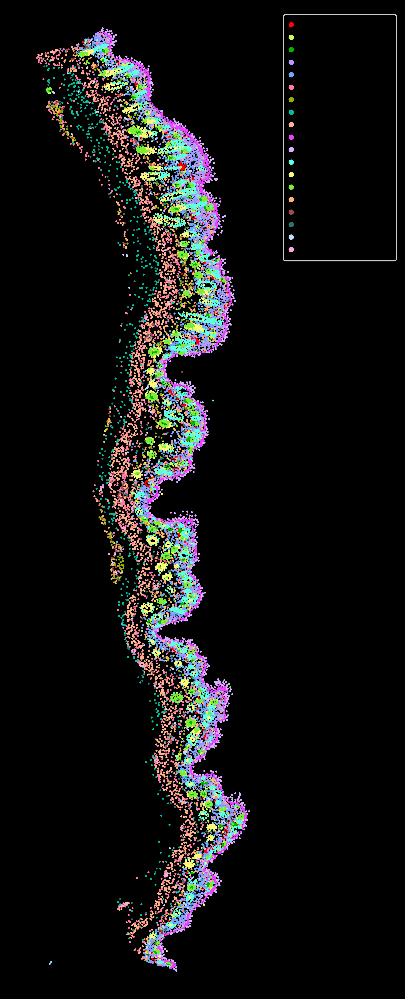

In [88]:
st.pl.cluster_plot(adata,use_label="leiden",
                  show_node=False, figsize=(4,15), dpi=600, size=3, image_alpha=0, show_image=False,)


plt.savefig("250305.leiden.svg", dpi=600, bbox_inches='tight', facecolor="black")

plt.show()

In [39]:
st.spatial.trajectory.detect_transition_markers_clades(adata,clade=64,use_raw_count=False,cutoff_spearman=0.05)

Detecting the transition markers of clade_64...
Transition markers result is stored in adata.uns['clade_64']


In [41]:
plt.rcParams["axes.facecolor"] = "white"  
plt.rcParams["figure.facecolor"] = "white"  
plt.rcParams["savefig.facecolor"] = "white"  

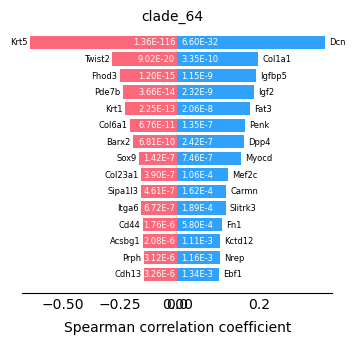

In [42]:
plt.rcParams["figure.figsize"] = (4,3.5)
st.pl.trajectory.transition_markers_plot(
    adata, 
    top_genes = 15, 
    trajectory = "clade_64", 
    dpi = 300,
    output = "./",   
    name = "250305.transition_markers_plot_clade_64.apm.svg"
)

In [43]:
st.spatial.trajectory.detect_transition_markers_clades(adata,clade=177,use_raw_count=False,cutoff_spearman=0.05)

Detecting the transition markers of clade_177...
Transition markers result is stored in adata.uns['clade_177']


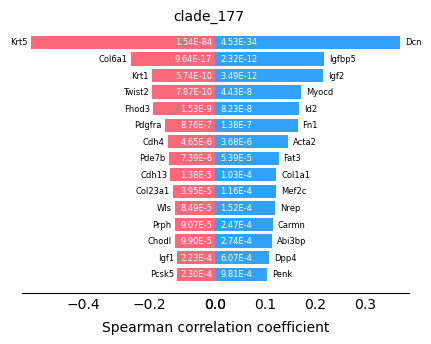

In [44]:
plt.rcParams["figure.figsize"] = (5,3.5)
st.pl.trajectory.transition_markers_plot(
    adata, 
    top_genes = 15, 
    trajectory = "clade_177", 
    dpi = 300,
    output = "./",   
    name = "250305.transition_markers_plot_clade_177.apm.svg"
)

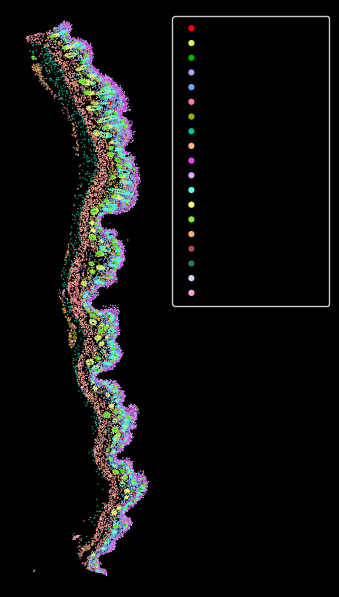

In [45]:
import matplotlib.pyplot as plt

# Set background color to black
plt.rcParams["figure.figsize"] = (2, 7.5)
plt.rcParams["axes.facecolor"] = "black"  # Background of the plot
plt.rcParams["figure.facecolor"] = "black"  # Background of the figure
plt.rcParams["savefig.facecolor"] = "black"  # Background of saved figure

fig, ax = plt.subplots()
st.pl.cluster_plot(adata, use_label="leiden", image_alpha=0, size=1, dpi=300, show_image=False, ax=ax)

plt.savefig("250303.cluster_plot_black_bg_smaller.svg", dpi=300, bbox_inches='tight', facecolor="black")

plt.show()

In [16]:
#ret -> hypo

In [46]:
adata.uns["iroot"] = st.spatial.trajectory.set_root(
    adata,
    use_label="leiden2",
    cluster="4",
    use_raw=True
)
adata.uns["iroot"]

9004

In [47]:
st.spatial.trajectory.pseudotime(adata,eps=50,use_rep="X_pca",use_label="leiden2")

All available trajectory paths are stored in adata.uns['available_paths'] with length < 4 nodes


In [48]:
st.spatial.trajectory.pseudotimespace_global(adata,use_label="leiden2",list_clusters=["4","5"])

Start to construct the trajectory: 4 -> 5


In [49]:
plt.rcParams["axes.facecolor"] = "black"  # Background of the plot
plt.rcParams["figure.facecolor"] = "black"  # Background of the figure
plt.rcParams["savefig.facecolor"] = "black"  # Background of saved figure


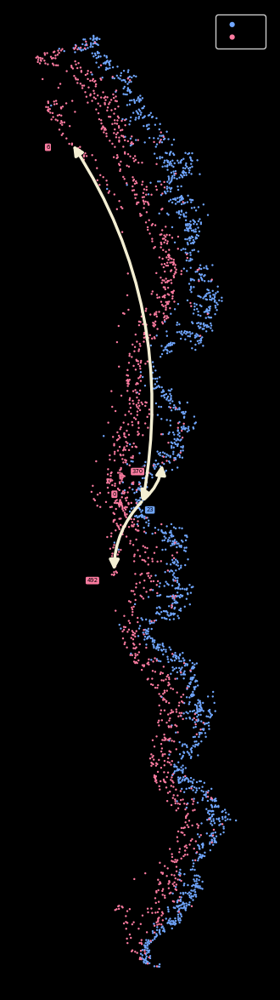

In [50]:
st.pl.cluster_plot(
    adata,
    use_label="leiden2",
    show_trajectories=True,
    list_clusters=["4","5"],
    show_subcluster=True,
    show_node=False, figsize=(4,15), dpi=600, size=3, image_alpha=0, show_image=False,
)

plt.savefig("250305.ret_to_rethypo.svg", dpi=600, bbox_inches='tight', facecolor="black")

plt.show()

In [51]:
st.spatial.trajectory.detect_transition_markers_clades(adata,clade=23,use_raw_count=False,cutoff_spearman=0.05)

Detecting the transition markers of clade_23...
Transition markers result is stored in adata.uns['clade_23']


In [52]:
plt.rcParams["axes.facecolor"] = "white"  # Background of the plot
plt.rcParams["figure.facecolor"] = "white"  # Background of the figure
plt.rcParams["savefig.facecolor"] = "white"  # Background of saved figure


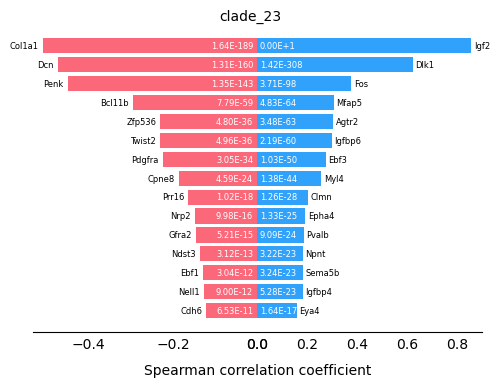

In [53]:
plt.rcParams["figure.figsize"] = (5.8,4)
st.pl.trajectory.transition_markers_plot(
    adata, 
    top_genes = 15, 
    trajectory = "clade_23", 
    dpi = 600,
    output = "./",   
    name = "250305.transition_markers_plot_ret_rehypo.svg"
)

In [60]:
#ret -> interstitial

In [54]:
adata.uns["iroot"] = st.spatial.trajectory.set_root(
    adata,
    use_label="leiden2",
    cluster="4",
    use_raw=True
)
adata.uns["iroot"]

9004

In [55]:
st.spatial.trajectory.pseudotime(adata,eps=50,use_rep="X_pca",use_label="leiden2")

All available trajectory paths are stored in adata.uns['available_paths'] with length < 4 nodes


In [56]:
st.spatial.trajectory.pseudotimespace_global(adata,use_label="leiden2",list_clusters=["4","7"])

Start to construct the trajectory: 4 -> 7


In [57]:
plt.rcParams["axes.facecolor"] = "black"  # Background of the plot
plt.rcParams["figure.facecolor"] = "black"  # Background of the figure
plt.rcParams["savefig.facecolor"] = "black"  # Background of saved figure


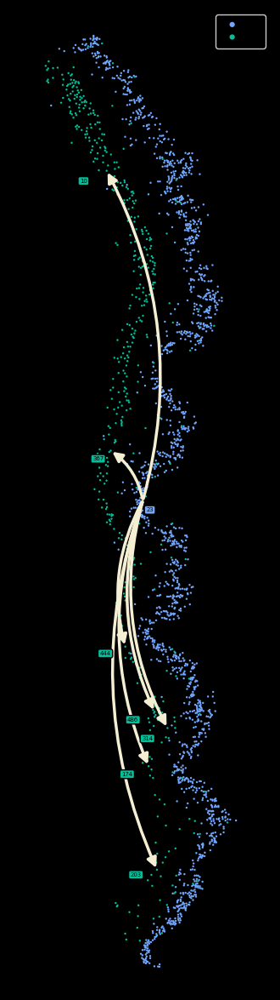

In [58]:
st.pl.cluster_plot(
    adata,
    use_label="leiden2",
    show_trajectories=True,
    list_clusters=["4","7"],
    show_subcluster=True,
    show_node=False, figsize=(4,15), dpi=600, size=3, image_alpha=0, show_image=False,
)

plt.savefig("250305.ret_to_interstitial.svg", dpi=600, bbox_inches='tight', facecolor="black")
plt.show()

In [59]:
st.spatial.trajectory.detect_transition_markers_clades(adata,clade=23,use_raw_count=False,cutoff_spearman=0.05)

Detecting the transition markers of clade_23...
Transition markers result is stored in adata.uns['clade_23']


In [60]:
plt.rcParams["axes.facecolor"] = "white"  # Background of the plot
plt.rcParams["figure.facecolor"] = "white"  # Background of the figure
plt.rcParams["savefig.facecolor"] = "white"  # Background of saved figure


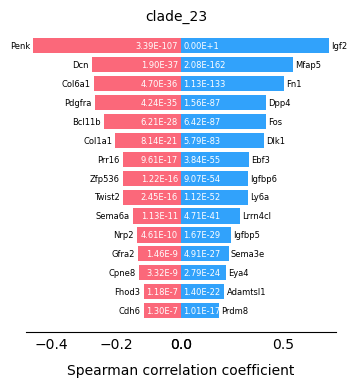

In [61]:
plt.rcParams["figure.figsize"] = (4,4)
st.pl.trajectory.transition_markers_plot(
    adata, 
    top_genes = 15, 
    trajectory = "clade_23", 
    dpi = 600,
    output = "./",   
    name = "250305.transition_markers_plot_ret_interstitial.svg"
)

In [69]:
#ret -> adipo

In [62]:
adata.uns["iroot"] = st.spatial.trajectory.set_root(
    adata,
    use_label="leiden2",
    cluster="4",
    use_raw=True
)
adata.uns["iroot"]

9004

In [63]:
st.spatial.trajectory.pseudotime(adata,eps=50,use_rep="X_pca",use_label="leiden2")

All available trajectory paths are stored in adata.uns['available_paths'] with length < 4 nodes


In [64]:
st.spatial.trajectory.pseudotimespace_global(adata,use_label="leiden2",list_clusters=["4","6"])

Start to construct the trajectory: 4 -> 6


In [65]:
plt.rcParams["axes.facecolor"] = "black"  # Background of the plot
plt.rcParams["figure.facecolor"] = "black"  # Background of the figure
plt.rcParams["savefig.facecolor"] = "black"  # Background of saved figure


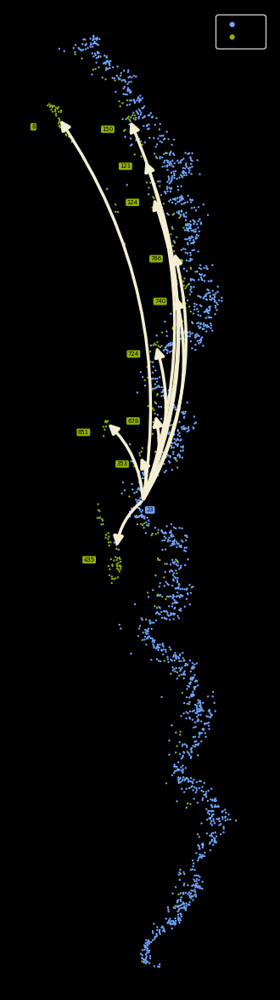

In [66]:
st.pl.cluster_plot(
    adata,
    use_label="leiden2",
    show_trajectories=True,
    list_clusters=["4","6"],
    show_subcluster=True,
    show_node=False, figsize=(4,15), dpi=600, size=3, image_alpha=0, show_image=False,
)
plt.savefig("250305.ret_to_adipo.svg", dpi=600, bbox_inches='tight', facecolor="black")

plt.show()

In [67]:
st.spatial.trajectory.detect_transition_markers_clades(adata,clade=23,use_raw_count=False,cutoff_spearman=0.05)

Detecting the transition markers of clade_23...
Transition markers result is stored in adata.uns['clade_23']


In [68]:
plt.rcParams["axes.facecolor"] = "white"  # Background of the plot
plt.rcParams["figure.facecolor"] = "white"  # Background of the figure
plt.rcParams["savefig.facecolor"] = "white"  # Background of saved figure


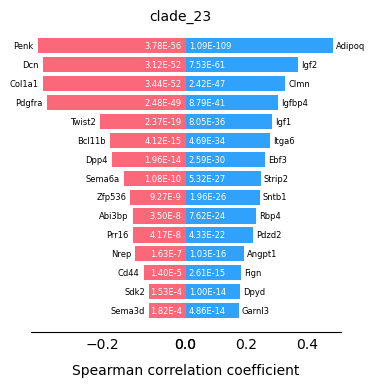

In [69]:
plt.rcParams["figure.figsize"] = (4,4)
st.pl.trajectory.transition_markers_plot(
    adata, 
    top_genes = 15, 
    trajectory = "clade_23", 
    dpi = 600,
    output = "./",   
   name = "250305.transition_markers_plot_ret_adipo.svg"
)

In [43]:
### figures

In [70]:
sc.set_figure_params(scanpy=True, dpi=300, dpi_save=300)

/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/stlearn_250218/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/stlearn_250218/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/stlearn_250218/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


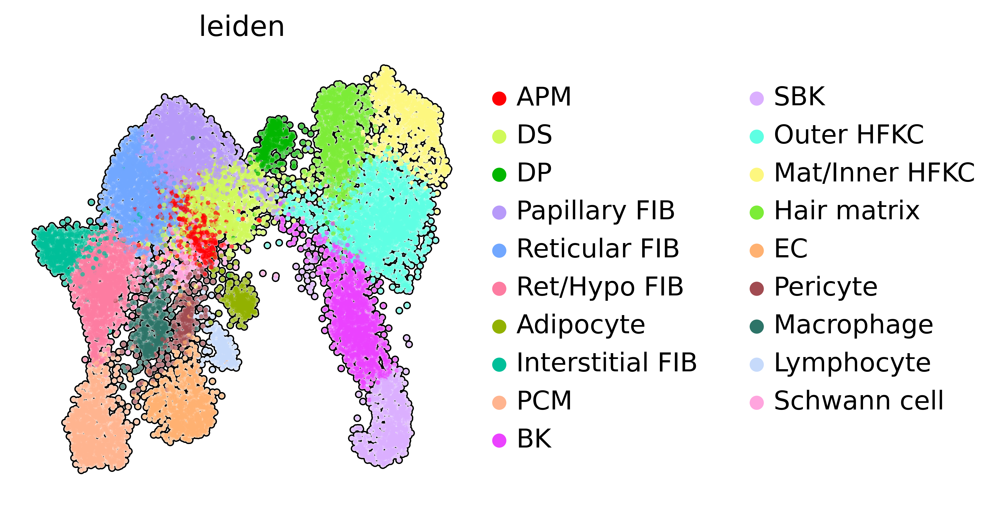

In [71]:
new_colors = [
    '#FF0004', '#D0F95A', '#02B600', '#B79AF9', '#71A7FF', '#FD7CA1',
    '#92B100', '#00BF99', '#FFB48F', '#EB42FF', '#DBAFFF', '#5EFFE3',
    '#FDF77F', '#7CEC37', '#FFB171', '#A14B51', '#2D7468', '#C6DAFB', '#FFA5DE'
]

sc.pl.umap(
    adata,
    color="leiden",  
    palette=new_colors, 
    size=20,  
    wspace=0.4 , add_outline=True, frameon=False, save="umap250305.pd2.newlabel_adipo.svg"
)

/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/stlearn_250218/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/stlearn_250218/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(


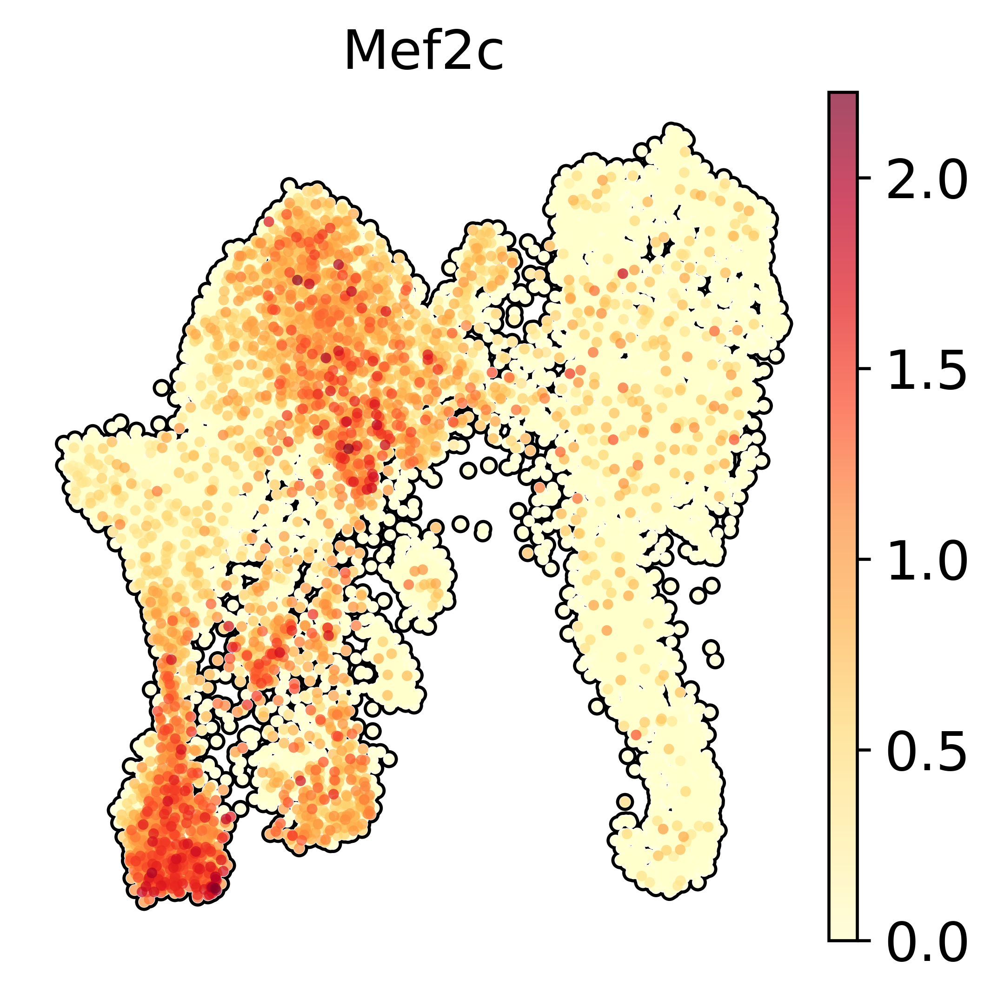

In [72]:
sc.pl.umap(
    adata,
    color="Mef2c", cmap="YlOrRd", 
    size=30,  
    wspace=0.4 , add_outline=True, frameon=False, save="250305.pd2.mef2c.spatial.UMAP.svg"
)

/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/stlearn_250218/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/stlearn_250218/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(


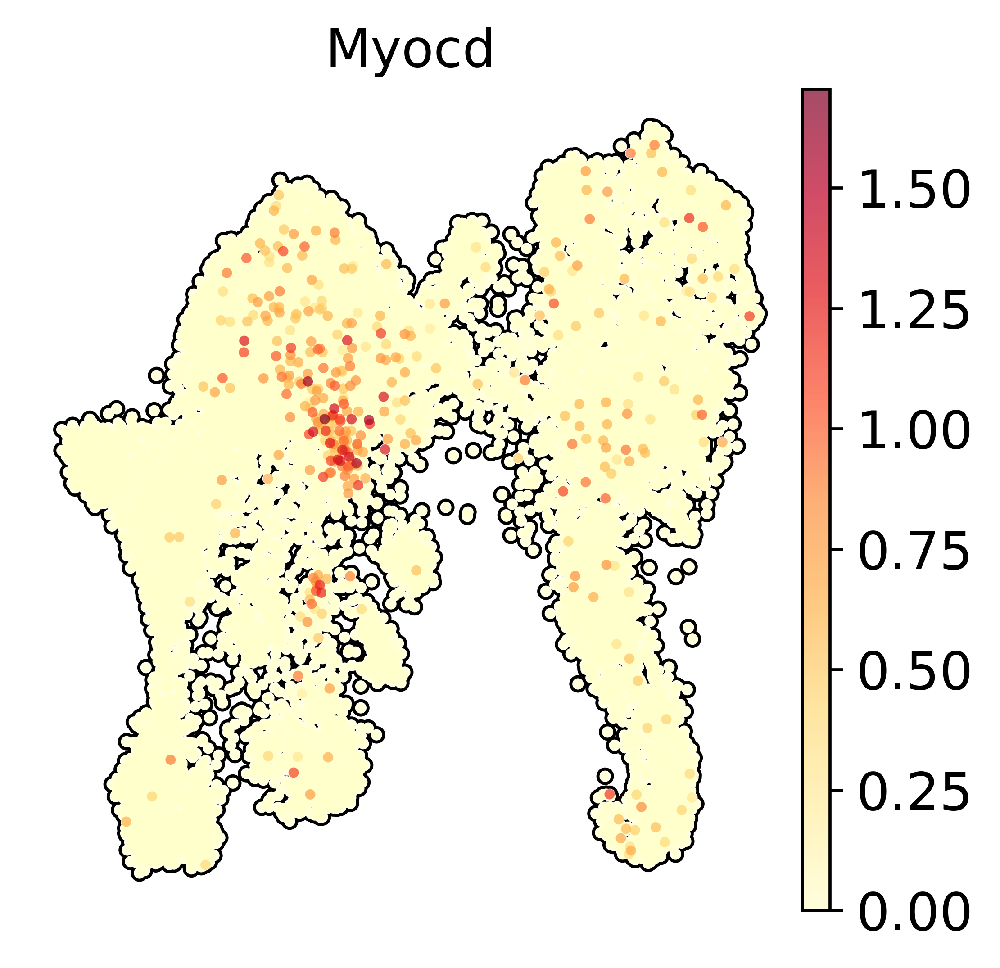

In [73]:
sc.pl.umap(
    adata,
    color="Myocd",  cmap="YlOrRd",
    size=30,  
    wspace=0.4 , add_outline=True, frameon=False, save="250305.pd2.myocd.spatial.UMAP.svg"
)

/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/stlearn_250218/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(
/mnt/gmi-l1/_90.User_Data/revolvefire/miniforge3/envs/stlearn_250218/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  ax.scatter(


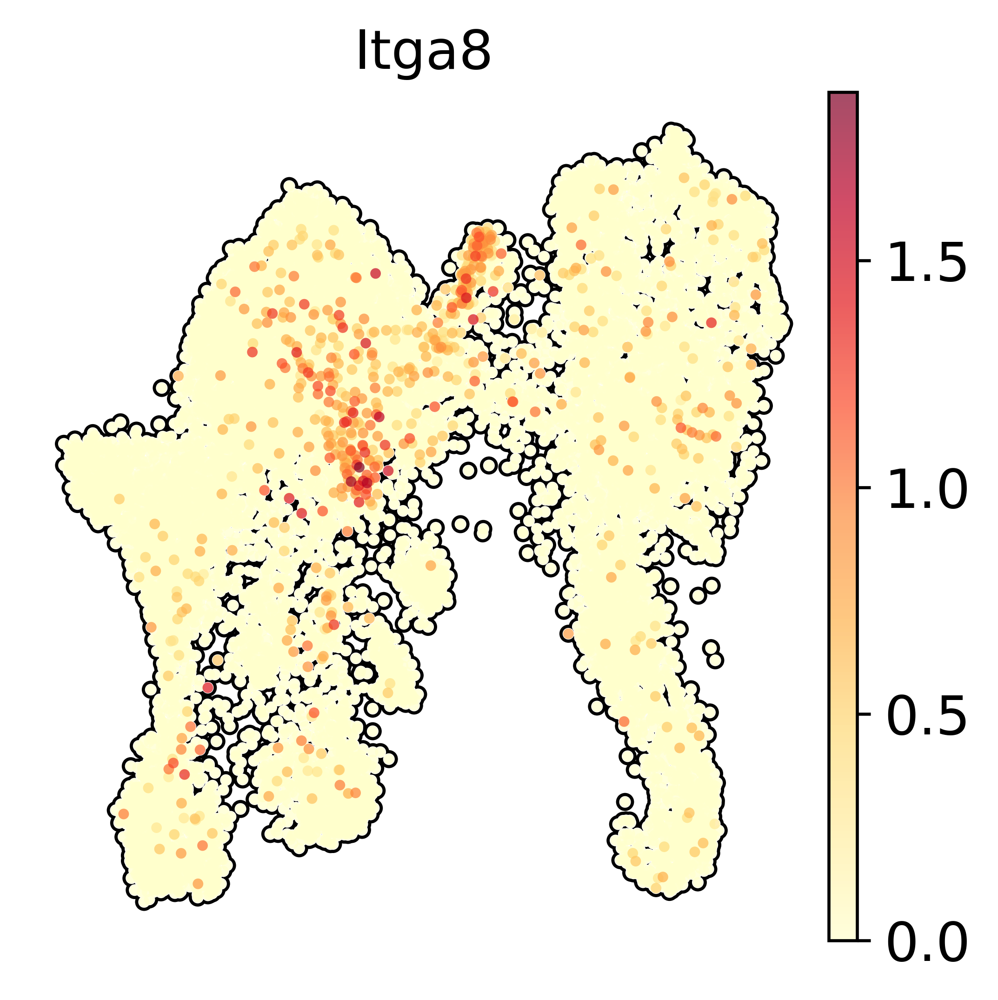

In [74]:
sc.pl.umap(
    adata,
    color="Itga8",  cmap="YlOrRd",
    size=30,  
    wspace=0.4 , add_outline=True, frameon=False, save="250305.pd2.itga8.spatial.UMAP.svg"
)

In [75]:
markers=['Itga8', 'Myocd', 'Mef2c', 'Col11a1', 'Lrrc15', 'Ebf1', 'Corin', 'Alx4', 'Wnt5a','Twist2', 'Pdgfra', 'Dpp4', 'Dlk1', 'Agtr2', 'Ly6a', 'Cxcl12', 'Adipoq','Mfap5', 'Igf2', 'Myl4', 'Krt5', 'Krt1', 'Barx2', 'Foxc1', 'Sox9', 'Msx2',  'Pecam1', 'Gucy1a1', 'Maf', 'Cd68', 'Cd53', 'Ikzf1', 'Sox10']

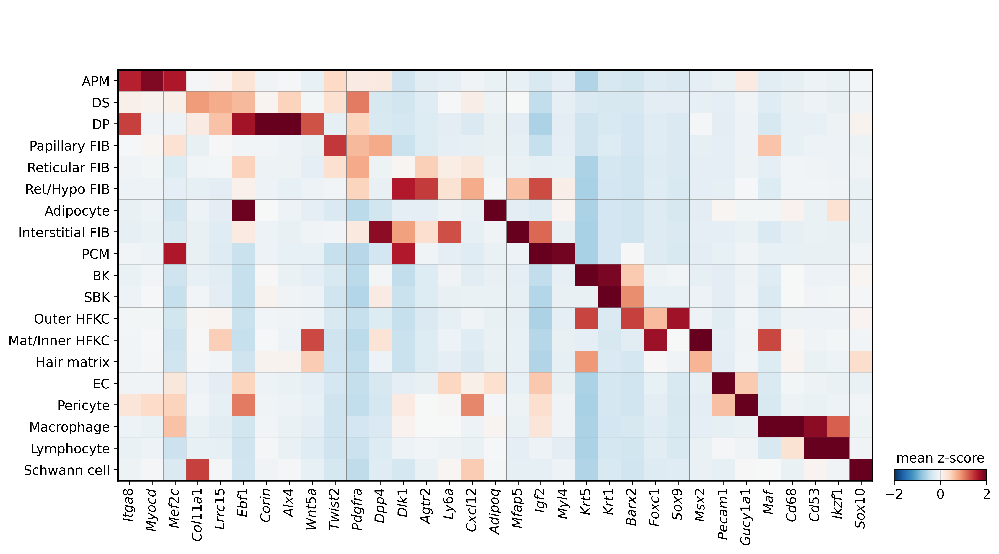

In [76]:
sc.pl.matrixplot(
    adata,
    markers,
    groupby="leiden",
    dendrogram=False,
    cmap="RdBu_r",
    layer="scaled",
    vmin=-2, vmax=2,
    show=False, colorbar_title="mean z-score", 
)
fig = plt.gcf()
ax = fig.axes[0]
tick_labels = [tick.get_text() for tick in ax.get_xticklabels()]
italic_labels = [f"$\\mathit{{{label}}}$" for label in tick_labels]
ax.set_xticks(np.arange(len(tick_labels)) + 0.5)
ax.set_xticklabels(italic_labels, )
#plt.savefig("250302.PD2.matrixplot_custom.svg", bbox_inches="tight")
plt.show()

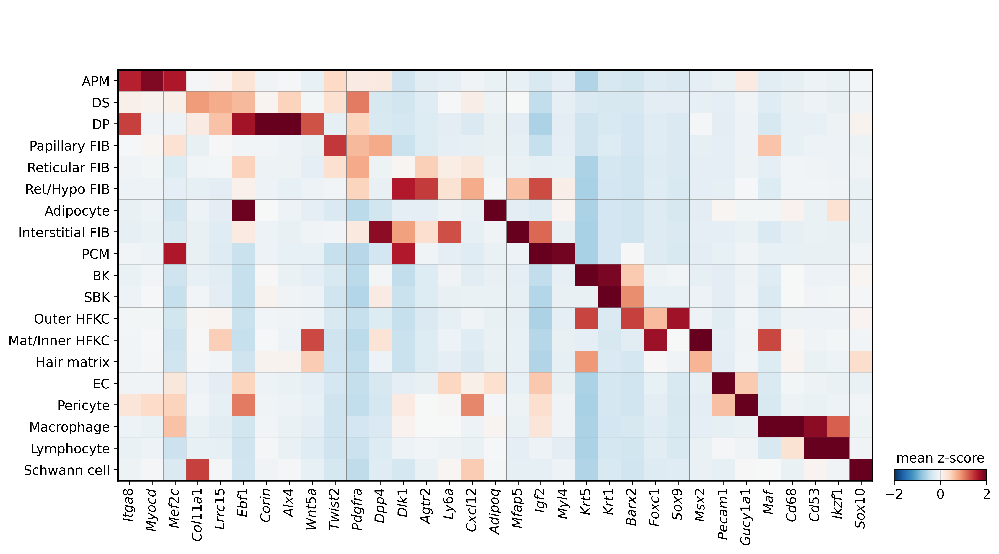

In [77]:
sc.pl.matrixplot(
    adata,
    markers,
    groupby="leiden",
    dendrogram=False,
    cmap="RdBu_r",
    layer="scaled",
    vmin=-2, vmax=2,
    show=False, colorbar_title="mean z-score", 
)
fig = plt.gcf()
ax = fig.axes[0]
tick_labels = [tick.get_text() for tick in ax.get_xticklabels()]
italic_labels = [f"$\\mathit{{{label}}}$" for label in tick_labels]
ax.set_xticks(np.arange(len(tick_labels)) + 0.5)
ax.set_xticklabels(italic_labels, )
plt.savefig("250305.PD2.matrixplot_custom.svg", bbox_inches="tight")
plt.show()

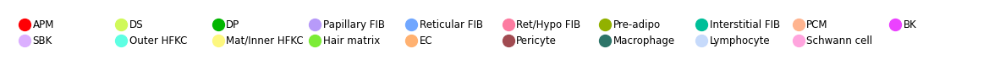

In [1]:
import matplotlib.pyplot as plt

# Define the data for the legend
labels = [
    'APM', 'DS', 'DP', 'Papillary FIB', 'Reticular FIB', 'Ret/Hypo FIB',
    'Pre-adipo', 'Interstitial FIB', 'PCM', 'BK', 'SBK', 'Outer HFKC',
    'Mat/Inner HFKC', 'Hair matrix', 'EC', 'Pericyte', 'Macrophage', 'Lymphocyte', 'Schwann cell'
]

colors = [
    '#FF0004', '#D0F95A', '#02B600', '#B79AF9', '#71A7FF', '#FD7CA1',
    '#92B100', '#00BF99', '#FFB48F', '#EB42FF', '#DBAFFF', '#5EFFE3',
    '#FDF77F', '#7CEC37', '#FFB171', '#A14B51', '#2D7468', '#C6DAFB', '#FFA5DE'
]

# Number of rows and columns for the legend grid
n_cols = 10 # Number of columns
n_rows = -(-len(labels) // n_cols)  # Calculate rows based on the number of items

# Create the figure and axis
fig, ax = plt.subplots(figsize=(15, 2))
ax.axis('off')  # Turn off the axis

# Adjust spacing between labels
horizontal_spacing = 6  # Horizontal spacing
vertical_spacing = 1.0    # Vertical spacing

# Add legend entries
for i, (label, color) in enumerate(zip(labels, colors)):
    row = i // n_cols  # Calculate the row index
    col = i % n_cols  # Calculate the column index
    ax.scatter(col * horizontal_spacing, -row * vertical_spacing, color=color, s=100)  # Add the color marker
    ax.text(col * horizontal_spacing + 0.5, -row * vertical_spacing, label, va='center', fontsize=8.5)  # Add the label

# Adjust the limits
ax.set_xlim(-1, n_cols * horizontal_spacing)
ax.set_ylim(-n_rows * vertical_spacing, 1)
ax.set_aspect('equal')

# Save the plot as a high-resolution image
plt.savefig("241212.pd2.legend_high_res.png", dpi=600, bbox_inches='tight')  # Save with 300 dpi and tight bounding box
plt.show()